# CDR Analysis

This notebook contains exercises to analyze aggregated CDR data. It uses mock CDR data for Ghana from February to May 2020. 

# Environment set-up
Run the cell below:

In [42]:
#------------------------------------------------------------------------
# Libraries installation

!pip install geopandas

#------------------------------------------------------------------------
# User defined functions

def time_complete(data, timefreq = 'D'):
    data = data.reset_index()
    timevar = data.columns[0]
    data[timevar] = data[timevar].astype('datetime64[D]')
    full_time_range = pd.date_range(data[timevar].min(),  
                                            data[timevar].max(), 
                                            freq = timefreq)
    data = data.set_index(timevar)
    data = data.reindex(full_time_range,  fill_value=0)
    data.index.name = 'date'
    return(data)

def day_lag(df):
    # Makse sure date is datetime type
    df['date'] = pd.to_datetime(df['date'])
    
    # Sort by region and date
    df = df.sort_values(['date'])
    
    # Lag value
    df['value_l'] = df['value'].shift(1)
    
    # Drop values if missing dates
    value_l = df['value_l'].where(df.date.diff() == dt.timedelta(days = 1), np.nan)
    
    return value_l


# Let's start

In [31]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import datetime as dt

First, let's import the datasets we will use on this exercise

In [3]:
from google.colab import files
files.upload()

Saving transactions_per_day.csv to transactions_per_day.csv
Saving movements_per_day.csv to movements_per_day.csv
Saving subscribers_per_day.csv to subscribers_per_day.csv
Saving admin1 (1).geojson to admin1 (1).geojson


{'admin1 (1).geojson': b'{"type":"FeatureCollection", "features":[{"type":"Feature","id":1,"geometry":{"type":"MultiPolygon","coordinates":[[[[-2.131456114,7.39048406],[-2.128857363,7.387313014],[-2.126906021,7.384931949],[-2.125538903,7.383193128],[-2.124588241,7.381983982],[-2.123232345,7.380464709],[-2.121762882,7.378677826],[-2.121459543,7.378308958],[-2.121055546,7.377817694],[-2.115870355,7.371554898],[-2.114977806,7.370464872],[-2.113991568,7.369260418],[-2.113812676,7.369041943],[-2.11308682,7.368155496],[-2.109941281,7.364313974],[-2.109381225,7.363600053],[-2.107132677,7.360733725],[-2.105909227,7.359373088],[-2.104211953,7.357292031],[-2.102793817,7.355553207],[-2.100370944,7.352595423],[-2.096749111,7.348173872],[-2.091610665,7.341933829],[-2.090398078,7.340446884],[-2.085038866,7.333874931],[-2.083717952,7.332263349],[-2.07923566,7.326794601],[-2.077033755,7.324054628],[-2.076666819,7.323628542],[-2.076299883,7.323202456],[-2.075986898,7.322980291],[-2.075358025,7.32253389

In [19]:
!ls

'admin1 (1).geojson'	 sample_data		   transactions_per_day.csv
 movements_per_day.csv	 subscribers_per_day.csv


Before we start, let's load and have a look at each one of the indicators.

In [20]:
# Load transactions per day data
trans = pd.read_csv('transactions_per_day.csv')
trans.head()

,pcod,date,value
0,fid000,2020-04-16,247557
1,fid000,2020-04-02,283691
2,fid000,2020-03-23,287474
3,fid000,2020-03-22,266737
4,fid000,2020-04-03,292242


In [21]:
# Load subscribers per day data
subs = pd.read_csv('subscribers_per_day.csv')
subs.head()

,pcod,date,value
0,fid000,2020-05-23,19968
1,fid000,2020-02-02,24341
2,fid000,2020-02-03,25204
3,fid000,2020-02-17,23137
4,fid000,2020-05-22,24637


In [22]:
# Load movements
mov = pd.read_csv('movements_per_day.csv')
mov.head()

,date,pcod_from,pcod_to,value
0,2020-03-20,fid000,fid000,17570
1,2020-04-29,fid000,fid000,16523
2,2020-04-01,fid000,fid000,16905
3,2020-03-08,fid000,fid000,16582
4,2020-04-15,fid000,fid000,15831


## Exercise 1 - Quality checks

First step is to take a quick look at the completeness and consistency of the data.

- Check the number of regions per day
- Check time completeness of the series
- Compare number of subscribers to the number of calls


### Part 1 instructions:
1. Aggregate the number of transactions per date for `transaction data` and `subscriber data`. Store the result in a new DataFrame called `trans_day` and `subs_day`
    - Calculate the number of unique regions per day (TIP: use the `pd.Series.nunique` function.
    - Calculate sum of total transactions per day
2. Test if any date has fewer than 16 regions
3. Run the time complete function (user defined) for `subscriber data` to create a new DataFrame replacing missing rows with zeros:
    `trans_day_tcomplete = time_complete(subs_day)`
4. Plot the `value` column of the time complete data frame.

Do you see anything unusual?



In [39]:
trans_day = trans.groupby('date').agg({'value': np.sum, 'pcod':pd.Series.nunique}).reset_index().sort_values('date')
trans_day

,date,value,pcod
0,2020-02-01,35336139,16
1,2020-02-02,32315055,16
2,2020-02-03,32942464,16
3,2020-02-05,33715354,16
4,2020-02-06,32267053,16
...,...,...,...
109,2020-05-27,25229732,16
110,2020-05-28,24338664,16
111,2020-05-29,25725623,16
112,2020-05-30,25451566,16


In [14]:
lower_reg = unique_reg[unique_reg.pcod < 16]
lower_reg

,date,pcod


In [40]:
subs_day = subs.groupby('date').agg({'value': np.sum, 'pcod':pd.Series.nunique}).reset_index().sort_values('date')
subs_day

,date,value,pcod
0,2020-02-01,1920780,16
1,2020-02-02,1830309,16
2,2020-02-03,1901959,16
3,2020-02-05,1904450,16
4,2020-02-06,1956387,16
...,...,...,...
109,2020-05-27,1703860,16
110,2020-05-28,1670635,16
111,2020-05-29,1756927,16
112,2020-05-30,1581476,16


In [45]:
# Note: the date index is not correct?
subs_day_tcomplete = time_complete(subs_day)
subs_day_tcomplete

,date,value,pcod
date,,,
1970-01-01,2020-02-01,1920780,16
1970-01-02,2020-02-02,1830309,16
1970-01-03,2020-02-03,1901959,16
1970-01-04,2020-02-05,1904450,16
1970-01-05,2020-02-06,1956387,16
...,...,...,...
1970-04-20,2020-05-27,1703860,16
1970-04-21,2020-05-28,1670635,16
1970-04-22,2020-05-29,1756927,16


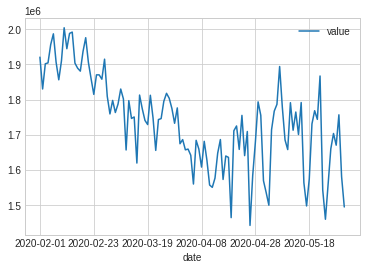

In [74]:
subs_day.plot(x = 'date',y = 'value')

## Exercise 2 - Changes over time

Now let's look how movement has changed over time. 

For simplicity we will use country level data and only look at movements between two different regions. Here's a quick summary of the comparisons we'll do:

- Absolute values
- Change from previous day
- Change from Baseline (defined as the average from February 1st to March 15th)

Also here is a time-line to help interpret the results:
- February 1st to March 15th: Baseline period
- March 16th: initial restrictions imposed
- March 30th: Lockdown measures on parts of Accra and Kumasi metropolitan areas

### Instructions
1. On the `mov` DataFrame, remove rows where users move within regions, that is `pcod_to` and `pcod_from` are the same
2. Aggregate `mov` DataFrame by `date` to have country level data
3. Use the `day_lag()` function to create the value from previous day for each date
4. Use the `bl_values()` function to calculate the baseline for each date
5. Create percent changes from previous day and from baseline columns.
6. Create 3 different line plots:
    - Level values of total movements
    - Percent change from previous day
    - Percent change from baseline

How does these 3 plots compare?

In [79]:
# Q1
mov = mov[mov['pcod_from'] != mov['pcod_to']]
mov

,date,pcod_from,pcod_to,value
114,2020-03-20,fid000,fid001,1101
115,2020-04-29,fid000,fid001,788
116,2020-04-01,fid000,fid001,666
117,2020-03-08,fid000,fid001,1312
118,2020-04-15,fid000,fid001,671
...,...,...,...,...
14234,2020-04-19,fid015,fid014,321
14235,2020-03-05,fid015,fid014,531
14236,2020-04-18,fid015,fid014,315
14237,2020-04-30,fid015,fid014,381


In [80]:
# Q2
mov_day = mov.groupby('date').agg({'value' : np.sum}).reset_index()
mov_day

,date,value
0,2020-02-01,149212
1,2020-02-02,120396
2,2020-02-03,121785
3,2020-02-05,112915
4,2020-02-06,116988
...,...,...
109,2020-05-27,81433
110,2020-05-28,82173
111,2020-05-29,96272
112,2020-05-30,83526


In [81]:
# Q3
mov_day['prev_value'] = day_lag(mov_day)
mov_day

,date,value,prev_value
0,2020-02-01,149212,NaN
1,2020-02-02,120396,149212.0
2,2020-02-03,121785,120396.0
3,2020-02-05,112915,NaN
4,2020-02-06,116988,112915.0
...,...,...,...
109,2020-05-27,81433,84353.0
110,2020-05-28,82173,81433.0
111,2020-05-29,96272,82173.0
112,2020-05-30,83526,96272.0


In [82]:
# Q4
mov_day = bl_values(mov_day)

,date,value,prev_value,value_bl
0,2020-02-01,149212,NaN,135134.857143
18,2020-02-02,120396,149212.0,111591.200000
34,2020-02-03,121785,120396.0,114557.000000
51,2020-02-05,112915,NaN,110765.250000
66,2020-02-06,116988,112915.0,119459.400000
...,...,...,...,...
65,2020-05-27,81433,84353.0,110765.250000
81,2020-05-28,82173,81433.0,119459.400000
98,2020-05-29,96272,82173.0,129605.166667
17,2020-05-30,83526,96272.0,135134.857143


In [69]:
# Q5
mov_day['p_change_prev'] = (mov_day['value'] - mov_day['prev_value'])/mov_day['prev_value']
mov_day['p_change_bl'] = (mov_day['value'] - mov_day['value_bl'])/mov_day['value_bl']


In [70]:
mov_day

,date,value,prev_value,value_bl,p_change_prev,p_change_bl
0,2020-02-01,149212,NaN,135134.857143,NaN,0.104171
1,2020-02-08,141079,134501.0,135134.857143,0.048907,0.043987
2,2020-02-15,139271,136757.0,135134.857143,0.018383,0.030608
3,2020-02-22,128380,129086.0,135134.857143,-0.005469,-0.049986
4,2020-02-29,134969,127417.0,135134.857143,0.059270,-0.001227
...,...,...,...,...,...,...
109,2020-04-28,76982,77973.0,109639.500000,-0.012710,-0.297863
110,2020-05-05,82783,79057.0,109639.500000,0.047131,-0.244953
111,2020-05-12,79309,80344.0,109639.500000,-0.012882,-0.276638
112,2020-05-19,77191,79445.0,109639.500000,-0.028372,-0.295956


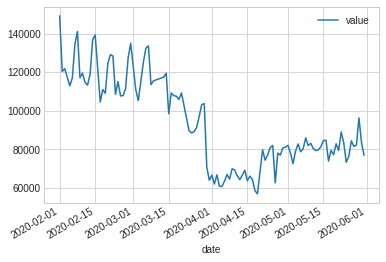

In [71]:
# Q6
mov_day.plot(x = 'date', y = 'value')

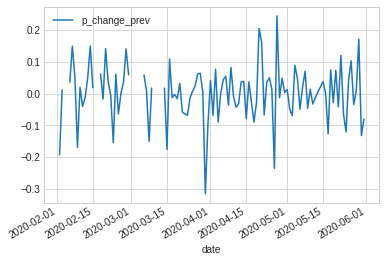

In [72]:
mov_day.plot(x = 'date', y = 'p_change_prev')

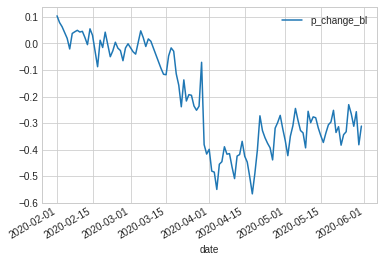

In [73]:
mov_day.plot(x = 'date', y = 'p_change_bl')

### Function definitions:

Before we move to part 4, lets review what the `bl_value()` function is doing.

In [54]:
def bl_values(df):
    # Makse sure date is datetime type
    df['date'] = pd.to_datetime(df['date'])

    # Create weekday variable to calculate baseline values
    df['weekday'] = df['date'].dt.dayofweek

    # Keep only entries from Feb 1st to Mar 15th
    bl = df[df['date'] < dt.datetime(2020, 3, 16)]

    # Calculate baseline averages for each weekday
    # bl_averages = bl.groupby(['pcod', 'weekday']).agg({'value': np.mean}).reset_index()
    bl_averages = bl.groupby(['weekday']).agg({'value': np.mean}).reset_index()
    
    # Merge bl averages as a column on original df
    # ndf = df.merge(bl_averages, on = ['pcod', 'weekday'],
    #                suffixes = ('', '_bl')).drop('weekday', axis = 1)
    ndf = df.merge(bl_averages, on = ['weekday'],
                  suffixes = ('', '_bl')).drop('weekday', axis = 1)

    return ndf



## Exercise 3 - Choropleth

In [ ]:
import folium

In [ ]:
gdf = gpd.read_file("admin1.geojson")
a1_geo = r'admin1.geojson'

In [ ]:
gdf.plot()


In [ ]:
# subs_day = subs_day.reset_index()
subs['month'] = subs['date'].dt.month
subs_month = subs.groupby(['month', 'pcod']).agg({'value': np.sum}).reset_index()
cho_data4 = subs_month[subs_month['month'] == 4]

In [ ]:

m = folium.Map(location=[7.28, -0.97], zoom_start=7)

folium.Choropleth(
    geo_data=a1_geo,
    name="May",
    data=cho_data5,
    columns=["pcod", "value"],
    key_on="feature.properties.pcod",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=0.2,
#     highlight = True,
#     reset = True,
#     overlay = False
).add_to(m)

# Add control to the side 
folium.LayerControl().add_to(m)

m